In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt

# Coords = (x, y, z, t, ring)
# ring means the channel (0 - 127)
# Coords (0, 0, 0) with range 0 are points that the LiDAR did not measure, so we should drop it.

puntos_1 = pd.read_csv('Data/1_coche.csv', sep=',')
carretera = pd.read_csv('Data/carretera.csv', sep=',')

puntos_1['range'] /= 1000  # Convertir a metros
carretera['range'] /= 1000  # Convertir a metros
puntos_1 = puntos_1[(puntos_1['range'] > 0.) & (puntos_1['t'] < 1181241184)]
puntos_1['t'] *= 1e-6  # Convertir a milisegundos
carretera = carretera[(carretera['range'] > 0.) & (carretera['t'] < 1181241184)]
carretera['t'] *= 1e-6  # Convertir a milisegundos
puntos_1.sort_values(by=['t'])

,x,y,z,intensity,t,reflectivity,ring,ambient,range
28673,-23.156588,3.763544,10.663235,33.0,0.000000,13,28,1933,25.757
86017,-29.619130,4.560926,-7.710754,28.0,0.000000,20,84,3188,30.955
24577,-22.135288,3.668699,11.575400,26.0,0.000000,11,24,2115,25.233
77825,-28.192215,4.275608,-4.448342,172.0,0.000000,72,76,3458,28.866
33793,-16.786018,0.961068,6.451665,56.0,0.000000,11,33,840,17.997
...,...,...,...,...,...,...,...,...,...
26112,3.481961,-0.182875,1.769919,287.0,24.949368,4,25,754,3.896
110080,3.682008,0.597857,-2.164261,105.0,24.949368,3,107,957,4.336
13824,3.478094,-0.198378,2.484752,232.0,24.949368,3,13,492,4.262
128512,2.161701,-0.129435,-2.031268,190.0,24.949368,3,125,1769,3.003


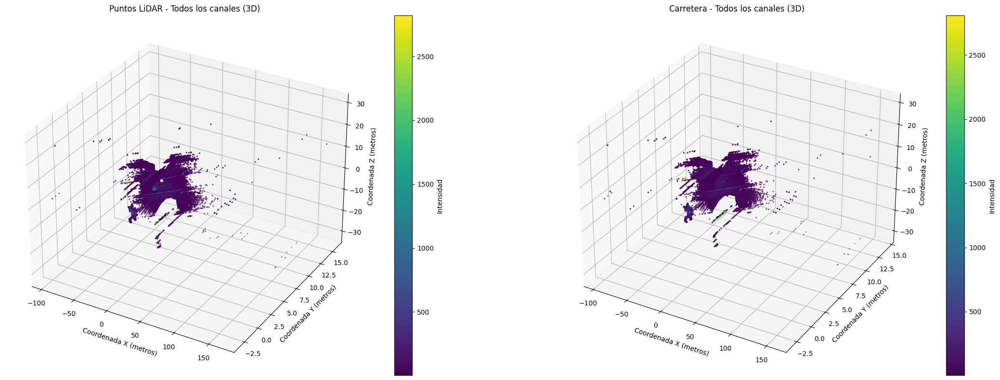

In [2]:
from mpl_toolkits.mplot3d import Axes3D

# Plot all points in a single scatter, coloring by intensity
# Adjust the layout so the two 3D plots are side by side
fig = plt.figure(figsize=(24, 8))

# First subplot (left)
ax = fig.add_subplot(121, projection='3d')
sc = ax.scatter(
    puntos_1['x'],
    puntos_1['y'],
    puntos_1['z'],
    c=puntos_1['intensity'],
    cmap='viridis',
    s=2
)
fig.colorbar(sc, ax=ax, label='Intensidad')
ax.set_title('Puntos LiDAR - Todos los canales (3D)')
ax.set_xlabel('Coordenada X (metros)')
ax.set_ylabel('Coordenada Y (metros)')
ax.set_zlabel('Coordenada Z (metros)')

# Second subplot (right)
ax2 = fig.add_subplot(122, projection='3d')
sc2 = ax2.scatter(
    carretera['x'],
    carretera['y'],
    carretera['z'],
    c=carretera['intensity'],
    cmap='viridis',
    s=2
)
fig.colorbar(sc2, ax=ax2, label='Intensidad')
ax2.set_title('Carretera - Todos los canales (3D)')
ax2.set_xlabel('Coordenada X (metros)')
ax2.set_ylabel('Coordenada Y (metros)')
ax2.set_zlabel('Coordenada Z (metros)')

plt.tight_layout()
plt.show()


In [3]:
puntos_without_carretera = puntos_1.merge(
	carretera[['x', 'y', 'z']],
	on=['x', 'y', 'z'],
	how='left',
	indicator=True
)
puntos_without_carretera = puntos_without_carretera[puntos_without_carretera['_merge'] == 'left_only']
puntos_without_carretera = puntos_without_carretera.drop(columns=['_merge'])
puntos_without_carretera

,x,y,z,intensity,t,reflectivity,ring,ambient,range
0,-13.000649,2.733196,13.144561,14.0,0.099080,3,0,649,18.670
1,-12.894675,2.793606,13.054574,12.0,0.150920,2,0,702,18.542
2,-12.856470,2.868021,13.033484,23.0,0.194512,4,0,546,18.512
3,-12.871898,2.954502,13.067228,17.0,0.248632,3,0,674,18.560
4,-12.926430,3.218639,13.180415,11.0,0.392472,2,0,599,18.721
...,...,...,...,...,...,...,...,...,...
57042,10.932133,3.238086,-11.504787,2542.0,24.173168,176,127,1679,16.233
57043,10.943031,3.168405,-11.495528,2583.0,24.221328,179,127,1874,16.220
57044,10.930527,3.092206,-11.462051,2452.0,24.267128,170,127,1958,16.173
57045,10.897206,3.010663,-11.407207,1825.0,24.313688,146,127,3053,16.096


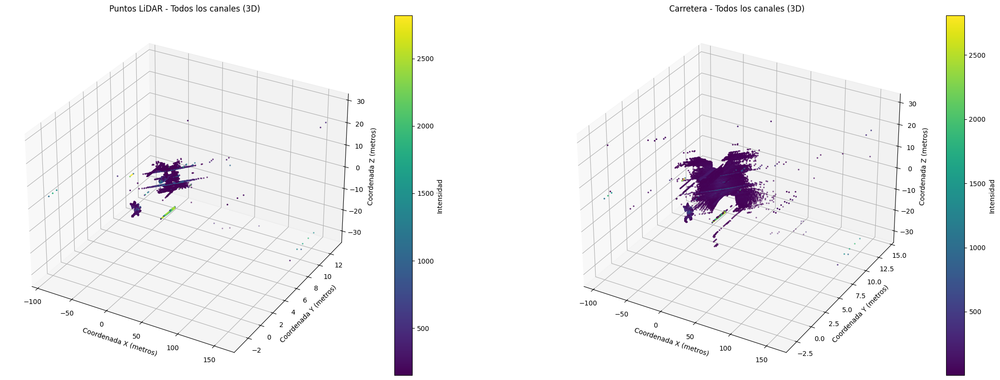

In [4]:
from mpl_toolkits.mplot3d import Axes3D

puntos_filtro_intensidad = puntos_1[puntos_1['intensity'] > 150]
fig = plt.figure(figsize=(24, 8))

# First subplot (left)
ax = fig.add_subplot(121, projection='3d')
sc = ax.scatter(
    puntos_filtro_intensidad['x'],
    puntos_filtro_intensidad['y'],
    puntos_filtro_intensidad['z'],
    c=puntos_filtro_intensidad['intensity'],
    cmap='viridis',
    s=2
)
fig.colorbar(sc, ax=ax, label='Intensidad')
ax.set_title('Puntos LiDAR - Todos los canales (3D)')
ax.set_xlabel('Coordenada X (metros)')
ax.set_ylabel('Coordenada Y (metros)')
ax.set_zlabel('Coordenada Z (metros)')

# Second subplot (right)
ax2 = fig.add_subplot(122, projection='3d')
sc2 = ax2.scatter(
    carretera['x'],
    carretera['y'],
    carretera['z'],
    c=carretera['intensity'],
    cmap='viridis',
    s=2
)
fig.colorbar(sc2, ax=ax2, label='Intensidad')
ax2.set_title('Carretera - Todos los canales (3D)')
ax2.set_xlabel('Coordenada X (metros)')
ax2.set_ylabel('Coordenada Y (metros)')
ax2.set_zlabel('Coordenada Z (metros)')

plt.tight_layout()
plt.show()


In [5]:
carretera.describe()

,x,y,z,intensity,t,reflectivity,ring,ambient,range
count,57317.000000,57317.000000,57317.000000,57317.000000,57317.000000,57317.000000,57317.000000,57317.000000,57317.000000
mean,0.205824,5.576111,0.091367,151.087601,12.509923,9.632814,62.616798,1718.183872,10.261884
std,9.189953,1.190740,5.010231,175.508169,6.456014,13.229473,36.678056,1017.813909,6.071746
min,-95.568890,-3.026819,-31.174494,5.000000,0.000000,1.000000,0.000000,259.000000,2.236000
25%,-4.468840,5.412472,-3.108812,78.000000,7.033952,5.000000,31.000000,1194.000000,6.766000
50%,0.021570,5.743454,0.110335,120.000000,12.502160,6.000000,62.000000,1419.000000,8.167000
75%,4.248515,6.035828,3.334118,165.000000,17.972448,9.000000,94.000000,1988.000000,11.692000
max,158.681290,14.168045,29.415686,2807.000000,24.949488,255.000000,127.000000,10511.000000,161.177000


In [6]:
puntos_1.describe()

,x,y,z,intensity,t,reflectivity,ring,ambient,range
count,57047.000000,57047.000000,57047.000000,57047.000000,57047.000000,57047.000000,57047.000000,57047.000000,57047.000000
mean,0.198721,5.504633,0.051327,180.941627,12.510500,10.582555,62.764966,1974.136554,10.218332
std,9.205485,1.223905,5.030193,241.428405,6.475789,13.980172,36.753102,1653.938305,6.125922
min,-95.591150,-3.026484,-31.093044,5.000000,0.000000,1.000000,0.000000,253.000000,2.214000
25%,-4.516991,5.268458,-3.137636,75.000000,6.984152,5.000000,30.000000,1195.000000,6.787000
50%,0.042466,5.730175,0.043796,121.000000,12.504560,6.000000,63.000000,1515.000000,8.189000
75%,4.271642,6.036360,3.353750,169.000000,17.972768,10.000000,94.000000,2271.000000,11.732500
max,167.198500,15.588192,29.421364,2819.000000,24.949368,255.000000,127.000000,65535.000000,168.365000


In [7]:
#Do a 3D scatter interactively with plotly
import plotly.express as px
fig = px.scatter_3d(puntos_1, x='x', y='y', z='z', color='intensity', title='Puntos LiDAR - Todos los canales (3D)', labels={'x':'Coordenada X (metros)', 'y':'Coordenada Y (metros)', 'z':'Coordenada Z (metros)', 'intensity':'Intensidad'})
fig.update_traces(marker=dict(size=2))
fig.show()

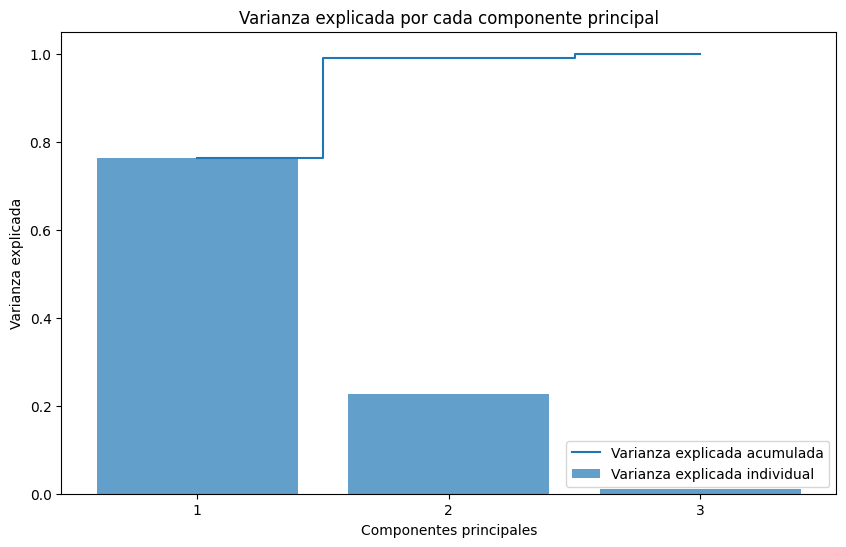

In [8]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)

data_carretera = carretera[['x', 'y', 'z']]

data_carretera_normalized = data_carretera - data_carretera.mean() #centering data
pca.fit(data_carretera_normalized)
normal = pca.components_[-1]

#plot the explained variance
plt.figure(figsize=(10, 6))
plt.bar(range(1, 4), pca.explained_variance_ / np.var(data_carretera_normalized, axis=0).sum(), alpha=0.7, align='center', label='Varianza explicada individual')
plt.step(range(1, 4), np.cumsum(pca.explained_variance_ / np.var(data_carretera_normalized, axis=0).sum()), where='mid', label='Varianza explicada acumulada')
plt.ylabel('Varianza explicada')
plt.xlabel('Componentes principales')
plt.xticks(range(1, 4))
plt.legend(loc='best')
plt.title('Varianza explicada por cada componente principal')
plt.show()

In [9]:
from sklearn.linear_model import RANSACRegressor, LinearRegression

X = data_carretera[['x','y']].values
y = data_carretera['z'].values

ransac = RANSACRegressor(LinearRegression(), residual_threshold=0.5)
ransac.fit(X, y)

a, b = ransac.estimator_.coef_
c = ransac.estimator_.intercept_

print(f"Plano RANSAC: z = {a:.4f}*x + {b:.4f}*y + {c:.4f}")


Plano RANSAC: z = 1.4324*x + -23.5295*y + 136.5728


In [10]:

# Calculate zz as before
xx, yy = np.meshgrid(
    np.linspace(data_carretera['x'].min(), data_carretera['x'].max(), 10),
    np.linspace(data_carretera['y'].min(), data_carretera['y'].max(), 10)
)
# D = -(a*x0 + b*y0 + c*z0)
# zz = (-D - a*xx - b*yy) / c

zz = a*xx + b*yy + c

# Limit zz to the max value of real z
z_max = data_carretera['z'].max()
z_min = data_carretera['z'].min()
zz = np.maximum(zz, z_min)
zz = np.minimum(zz, z_max)

import plotly.graph_objects as go

scatter = go.Scatter3d(
    x=puntos_1['x'],
    y=puntos_1['y'],
    z=puntos_1['z'],
    mode='markers',
    marker=dict(size=2, color='blue'),
    name='Puntos de la carretera'
)

# surface = go.Surface(
#     x=xx,
#     y=yy,
#     z=zz,
#     colorscale='Reds',
#     opacity=0.5,
#     showscale=False,
#     name='Plano RANSAC'
# )

fig = go.Figure(data=scatter)
fig.update_layout(
    title='Ajuste de plano a los puntos de la carretera usando RANSAC',
    scene=dict(
        xaxis_title='Coordenada X (metros)',
        yaxis_title='Coordenada Y (metros)',
        zaxis_title='Coordenada Z (metros)'
    ),
    legend=dict(itemsizing='constant')
)
fig.show()

In [11]:
puntos_1['x'] = np.round(puntos_1['x'], 2)
puntos_1['y'] = np.round(puntos_1['y'], 2)
puntos_1['z'] = np.round(puntos_1['z'], 2)

carretera['x'] = np.round(carretera['x'], 2)
carretera['y'] = np.round(carretera['y'], 2)
carretera['z'] = np.round(carretera['z'], 2)

# 'how' must be one of 'left', 'right', 'outer', 'inner'
puntos_both = puntos_1.merge(carretera, on=['x', 'y', 'z'], how='outer', indicator=True)

puntos_both = puntos_both.drop_duplicates(subset=['x', 'y', 'z'])
puntos_both['_merge'].value_counts()

_merge
right_only    48582
left_only     48312
both           8735
Name: count, dtype: int64

In [12]:
X = puntos_1[['x','y']].values

pred_z = ransac.predict(X)

puntos_1['pred_z'] = pred_z
puntos_1['residual'] = abs(puntos_1['z'] - puntos_1['pred_z'])
puntos_no_plano = puntos_1[puntos_1['residual'] > 7]
puntos_no_plano

,x,y,z,intensity,t,reflectivity,ring,ambient,range,pred_z,residual
3,-13.00,2.73,13.14,14.0,0.099080,3,0,649,18.670,53.716064,40.576064
4,-12.89,2.79,13.05,12.0,0.150920,2,0,702,18.542,52.461857,39.411857
5,-12.86,2.87,13.03,23.0,0.194512,4,0,546,18.512,50.622468,37.592468
6,-12.87,2.95,13.07,17.0,0.248632,3,0,674,18.560,48.725783,35.655783
9,-12.93,3.22,13.18,11.0,0.392472,2,0,599,18.721,42.286870,29.106870
...,...,...,...,...,...,...,...,...,...,...,...
130544,10.93,3.24,-11.50,2542.0,24.173168,176,127,1679,16.233,75.993366,87.493366
130545,10.94,3.17,-11.50,2583.0,24.221328,179,127,1874,16.220,77.654756,89.154756
130546,10.93,3.09,-11.46,2452.0,24.267128,170,127,1958,16.173,79.522793,90.982793
130547,10.90,3.01,-11.41,1825.0,24.313688,146,127,3053,16.096,81.362182,92.772182


In [13]:

# Calculate zz as before
xx, yy = np.meshgrid(
    np.linspace(data_carretera['x'].min(), data_carretera['x'].max(), 10),
    np.linspace(data_carretera['y'].min(), data_carretera['y'].max(), 10)
)
# D = -(a*x0 + b*y0 + c*z0)
# zz = (-D - a*xx - b*yy) / c

zz = a*xx + b*yy + c

# Limit zz to the max value of real z
z_max = data_carretera['z'].max()
z_min = data_carretera['z'].min()
zz = np.maximum(zz, z_min)
zz = np.minimum(zz, z_max)

import plotly.graph_objects as go

scatter = go.Scatter3d(
    x=puntos_no_plano['x'],
    y=puntos_no_plano['y'],
    z=puntos_no_plano['z'],
    mode='markers',
    marker=dict(size=2, color='blue'),
    name='Puntos de la carretera'
)

surface = go.Surface(
    x=xx,
    y=yy,
    z=zz,
    colorscale='Reds',
    opacity=0.5,
    showscale=False,
    name='Plano RANSAC'
)

fig = go.Figure(data=[scatter, surface])
fig.update_layout(
    title='Ajuste de plano a los puntos de la carretera usando RANSAC',
    scene=dict(
        xaxis_title='Coordenada X (metros)',
        yaxis_title='Coordenada Y (metros)',
        zaxis_title='Coordenada Z (metros)'
    ),
    legend=dict(itemsizing='constant')
)
fig.show()

In [14]:
len(puntos_1['x'].unique()), len(puntos_1['y'].unique()), len(puntos_1['z'].unique())

(5318, 922, 3005)

In [15]:
puntos_both['final_intensity'] = puntos_both['intensity_y'] - puntos_both['intensity_x']
# puntos_both['final_intensity'] = np.clip(puntos_both['final_intensity'], 0, None)

# puntos_coche = puntos_both[puntos_both['final_intensity'] > 0]

puntos_coche = puntos_both[puntos_both['_merge'] == 'left_only']

puntos_coche

,x,y,z,intensity_x,t_x,reflectivity_x,ring_x,ambient_x,range_x,intensity_y,t_y,reflectivity_y,ring_y,ambient_y,range_y,_merge,final_intensity
0,-95.59,-1.72,24.93,18.0,0.194512,116.0,42.0,2322.0,98.796,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
2,-90.42,-1.92,4.46,1475.0,0.929592,212.0,59.0,2672.0,90.546,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
7,-90.31,-3.03,4.46,1118.0,0.833712,200.0,59.0,3065.0,90.468,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
8,-83.21,0.59,-6.95,21.0,0.392472,106.0,70.0,1876.0,83.505,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
9,-83.20,0.08,-6.95,20.0,0.345232,107.0,70.0,2108.0,83.491,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105620,158.62,11.16,-25.00,1460.0,23.244456,229.0,76.0,2306.0,160.976,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
105621,158.63,9.21,-24.98,1743.0,23.338816,236.0,76.0,2297.0,160.858,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
105624,158.65,8.97,-26.98,900.0,24.121568,216.0,77.0,1909.0,161.188,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN
105627,158.69,7.02,-26.97,254.0,24.221328,183.0,77.0,2443.0,161.120,NaN,NaN,NaN,NaN,NaN,NaN,left_only,NaN


In [16]:
#Do a 3D scatter interactively with plotly
fig = px.scatter_3d(puntos_coche, x='x', y='y', z='z', color='intensity_x', title='Puntos LiDAR - Todos los canales (3D)', labels={'x':'Coordenada X (metros)', 'y':'Coordenada Y (metros)', 'z':'Coordenada Z (metros)', 'intensity':'Intensidad'})
fig.update_traces(marker=dict(size=2))
fig.show()

# Using Grid

In [17]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.spatial import KDTree

# Coords = (x, y, z, t, ring)
# ring means the channel (0 - 127)
# Coords (0, 0, 0) with range 0 are points that the LiDAR did not measure, so we should drop it.

puntos_1 = pd.read_csv('Data/1_coche.csv', sep=',')
carretera = pd.read_csv('Data/carretera.csv', sep=',')

puntos_1['range'] /= 1000  # Convertir a metros
carretera['range'] /= 1000  # Convertir a metros
puntos_1 = puntos_1[(puntos_1['range'] > 0.) & (puntos_1['t'] < 1181241184)]
puntos_1['t'] *= 1e-6  # Convertir a milisegundos
carretera = carretera[(carretera['range'] > 0.) & (carretera['t'] < 1181241184)]
carretera['t'] *= 1e-6  # Convertir a milisegundos

puntos_1['x'] = np.round(puntos_1['x'], 2)
puntos_1['y'] = np.round(puntos_1['y'], 2)
puntos_1['z'] = np.round(puntos_1['z'], 2)

carretera['x'] = np.round(carretera['x'], 2)
carretera['y'] = np.round(carretera['y'], 2)
carretera['z'] = np.round(carretera['z'], 2)

In [18]:
coords_carretera = carretera[['x', 'y', 'z']].values
coords_puntos = puntos_1[['x', 'y', 'z']].values
coords_carretera = carretera[['x', 'y', 'z']].values
coords_puntos = puntos_1[['x', 'y', 'z']].values

tree = KDTree(coords_carretera)
distances, indices = tree.query(coords_puntos)

matches = distances < 0.4

supuesto_coche = puntos_1[~matches]
supuesto_coche
tree = KDTree(coords_carretera)
distances, indices = tree.query(coords_puntos)

matches = distances < 0.4

supuesto_coche = puntos_1[~matches]
supuesto_coche

,x,y,z,intensity,t,reflectivity,ring,ambient,range
418,13.55,5.54,14.48,17.0,20.367392,5,0,1486,20.571
7655,16.66,5.66,14.57,23.0,23.728856,12,7,2022,22.824
15851,19.61,5.93,13.71,23.0,23.928416,14,15,1565,24.638
19503,-21.65,2.78,13.06,12.0,2.247984,7,19,1007,25.421
20924,23.75,6.21,14.25,20.0,21.635944,10,20,1410,28.374
...,...,...,...,...,...,...,...,...,...
126038,-15.84,5.70,-15.32,12.0,4.150848,7,123,1302,22.796
126039,-15.63,5.73,-15.15,15.0,4.199928,10,123,2255,22.537
126427,18.64,8.09,-18.50,48.0,23.148496,34,123,2526,27.516
128087,-8.55,5.78,-9.92,33.0,4.199928,6,125,3182,14.349


In [19]:
#Do a 3D scatter interactively with plotly
fig = px.scatter_3d(supuesto_coche, x='x', y='y', z='z', color='intensity', title='Puntos LiDAR - Todos los canales (3D)', labels={'x':'Coordenada X (metros)', 'y':'Coordenada Y (metros)', 'z':'Coordenada Z (metros)', 'intensity':'Intensidad'})
fig.update_traces(marker=dict(size=2))
fig.show()

In [20]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=10)
dbscan.fit(supuesto_coche[['x', 'y', 'z']])
supuesto_coche['cluster'] = dbscan.labels_
supuesto_coche

C:\Users\mario\AppData\Local\Temp\ipykernel_7272\101281114.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,x,y,z,intensity,t,reflectivity,ring,ambient,range,cluster
418,13.55,5.54,14.48,17.0,20.367392,5,0,1486,20.571,-1
7655,16.66,5.66,14.57,23.0,23.728856,12,7,2022,22.824,-1
15851,19.61,5.93,13.71,23.0,23.928416,14,15,1565,24.638,-1
19503,-21.65,2.78,13.06,12.0,2.247984,7,19,1007,25.421,-1
20924,23.75,6.21,14.25,20.0,21.635944,10,20,1410,28.374,-1
...,...,...,...,...,...,...,...,...,...,...
126038,-15.84,5.70,-15.32,12.0,4.150848,7,123,1302,22.796,-1
126039,-15.63,5.73,-15.15,15.0,4.199928,10,123,2255,22.537,-1
126427,18.64,8.09,-18.50,48.0,23.148496,34,123,2526,27.516,-1
128087,-8.55,5.78,-9.92,33.0,4.199928,6,125,3182,14.349,-1


In [21]:
#Do a 3D scatter interactively with plotly
fig = px.scatter_3d(supuesto_coche, x='x', y='y', z='z', color='cluster', title='Puntos LiDAR - Todos los canales (3D)', labels={'x':'Coordenada X (metros)', 'y':'Coordenada Y (metros)', 'z':'Coordenada Z (metros)', 'intensity':'Intensidad'})
fig.update_traces(marker=dict(size=2))
fig.show()

# Doble coche

In [22]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from scipy.spatial import KDTree

# Coords = (x, y, z, t, ring)
# ring means the channel (0 - 127)
# Coords (0, 0, 0) with range 0 are points that the LiDAR did not measure, so we should drop it.

puntos_1 = pd.read_csv('Data/coche_coche.csv', sep=',')
carretera = pd.read_csv('Data/carretera.csv', sep=',')

puntos_1['range'] /= 1000  # Convertir a metros
carretera['range'] /= 1000  # Convertir a metros
puntos_1 = puntos_1[(puntos_1['range'] > 0.) & (puntos_1['t'] < 1181241184)]
puntos_1['t'] *= 1e-6  # Convertir a milisegundos
carretera = carretera[(carretera['range'] > 0.) & (carretera['t'] < 1181241184)]
carretera['t'] *= 1e-6  # Convertir a milisegundos

puntos_1['x'] = np.round(puntos_1['x'], 2)
puntos_1['y'] = np.round(puntos_1['y'], 2)
puntos_1['z'] = np.round(puntos_1['z'], 2)

carretera['x'] = np.round(carretera['x'], 2)
carretera['y'] = np.round(carretera['y'], 2)
carretera['z'] = np.round(carretera['z'], 2)

In [23]:
coords_carretera = carretera[['x', 'y', 'z']].values
coords_puntos = puntos_1[['x', 'y', 'z']].values

tree = KDTree(coords_carretera)
distances, indices = tree.query(coords_puntos)

matches = distances < 0.3

supuesto_coche = puntos_1[~matches]
supuesto_coche

,x,y,z,intensity,t,reflectivity,ring,ambient,range
418,13.46,5.50,14.38,19.0,20.365880,6,0,1525,20.428
2088,-18.37,3.46,17.69,22.0,1.903432,18,2,2802,25.717
2102,-13.77,3.84,13.54,20.0,2.587824,7,2,1332,19.673
2509,14.31,5.59,14.55,19.0,22.462464,9,2,1483,21.143
6180,-20.22,3.34,17.48,29.0,1.705232,22,6,2541,26.924
...,...,...,...,...,...,...,...,...,...
126412,13.83,7.58,-14.34,15.0,22.417904,9,123,1950,21.348
126427,18.66,8.09,-18.52,45.0,23.147984,34,123,2912,27.540
127371,12.58,7.47,-13.66,9.0,19.245248,3,124,1563,20.055
127397,21.81,8.62,-21.94,14.0,20.510960,13,124,1915,32.145


In [24]:
#Do a 3D scatter interactively with plotly
fig = px.scatter_3d(supuesto_coche, x='x', y='y', z='z', color='intensity', title='Puntos LiDAR - Todos los canales (3D)', labels={'x':'Coordenada X (metros)', 'y':'Coordenada Y (metros)', 'z':'Coordenada Z (metros)', 'intensity':'Intensidad'})
fig.update_traces(marker=dict(size=2))
fig.show()

In [25]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.8, min_samples=10)
dbscan.fit(supuesto_coche[['x', 'y', 'z']])
supuesto_coche['cluster'] = dbscan.labels_
supuesto_coche

C:\Users\mario\AppData\Local\Temp\ipykernel_7272\3427420397.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,x,y,z,intensity,t,reflectivity,ring,ambient,range,cluster
418,13.46,5.50,14.38,19.0,20.365880,6,0,1525,20.428,-1
2088,-18.37,3.46,17.69,22.0,1.903432,18,2,2802,25.717,-1
2102,-13.77,3.84,13.54,20.0,2.587824,7,2,1332,19.673,-1
2509,14.31,5.59,14.55,19.0,22.462464,9,2,1483,21.143,-1
6180,-20.22,3.34,17.48,29.0,1.705232,22,6,2541,26.924,-1
...,...,...,...,...,...,...,...,...,...,...
126412,13.83,7.58,-14.34,15.0,22.417904,9,123,1950,21.348,-1
126427,18.66,8.09,-18.52,45.0,23.147984,34,123,2912,27.540,-1
127371,12.58,7.47,-13.66,9.0,19.245248,3,124,1563,20.055,-1
127397,21.81,8.62,-21.94,14.0,20.510960,13,124,1915,32.145,-1


In [26]:
#Do a 3D scatter interactively with plotly
fig = px.scatter_3d(supuesto_coche, x='x', y='y', z='z', color='cluster', title='Puntos LiDAR - Todos los canales (3D)', labels={'x':'Coordenada X (metros)', 'y':'Coordenada Y (metros)', 'z':'Coordenada Z (metros)', 'intensity':'Intensidad'})
fig.update_traces(marker=dict(size=2))
fig.show()